In [1]:
import numpy as np
import pandas as pd
import geopandas as gpd
import xarray as xr
import contextily as ctx
import matplotlib.pyplot as plt
import xyzservices as xyz
import coiled
#import hvplot.xarray
import cartopy.crs as ccrs
from global_snowmelt_runoff_onset.config import Config, Tile
import easysnowdata
import global_snowmelt_runoff_onset.processing as processing
import rioxarray as rxr

In [2]:
config = Config('config/global_config_v9.txt')

SAS token is valid until 2025-12-20 00:44 UTC (120.9 hours)
----------------------------------------
Configuration loaded:
config_name = global_config_v9
version = v9
resolution = 0.00072000072000072
bands = vv
mountain_snow_only = False
spatial_chunk_dim_s1_read = 2048
spatial_chunk_dim_s1_process = 512
spatial_chunk_dim_zarr_output = 2048
bbox_left = -179.999
bbox_right = 179.999
bbox_top = 81.099
bbox_bottom = -59.999
wy_start = 2015
wy_end = 2024
low_backscatter_threshold = 0.001
min_monthly_acquisitions = 1
max_allowed_days_gap_per_orbit = 30
min_years_for_median_std = 3
extend_search_window_beyond_sdd_days = 16
min_consec_snow_days_for_seasonal_snow = 56
valid_tiles_geojson_path = processing/tile_data/global_tiles_with_seasonal_snow.geojson
tile_results_path = processing/tile_data/tile_results_v9.csv
global_runoff_zarr_store_azure_path = snowmelt/snowmelt_runoff_onset/global_v9.zarr
seasonal_snow_mask_zarr_store_azure_path = snowmelt/snow_cover/global_modis_snow_cover.zarr
season

In [3]:
rainier_bbox_gdf = gpd.read_file("https://github.com/egagli/easysnowdata/raw/refs/heads/main/docs/examples/mt_rainier.geojson")
rainier_bbox_gdf

,geometry
0,"POLYGON ((-121.94225 46.99728, -121.94225 46.7..."


In [ ]:
s2 = easysnowdata.remote_sensing.Sentinel2(bbox_input=rainier_bbox_gdf,
                                      start_date = '2020-04-01', # '2020-03-12'
                                      end_date = '2020-04-30',#'2020-08-31', '2020-04-04'
                                      resolution=40,
                                      )

In [ ]:
s2.data

In [ ]:
s2.get_rgb()

In [ ]:
s2.rgb#.dropna(dim='time',how='any')

In [ ]:
s2_rgb_da = s2.rgb.where(s2.rgb.sum(dim='band')>0).dropna(dim='time',thresh=0.8*(3*len(s2.rgb.y.values))*len(s2.rgb.x.values)).compute()
s2_rgb_da

In [ ]:
f = s2_rgb_da.plot.imshow(col='time', robust=True, col_wrap=6, figsize=(12,3))

for ax, time, in zip(f.axs.flat, s2_rgb_da.time.values):
    local_time = pd.to_datetime(time).tz_localize('UTC').tz_convert('America/Los_Angeles')
    #ax.set_title(f'{local_time.strftime("%B %d, %Y")}\n{local_time.strftime("%I:%M%p")}')
    ax.set_title(f'{local_time.strftime("%B %d, %Y")}',y=1.00)

    ax.axis('off')
    ax.set_aspect('equal')
    
f.fig.subplots_adjust(wspace=-0.00)

In [ ]:
f,ax=plt.subplots(figsize=(4,5),layout='constrained')
s2_rgb_da.sel(time='2020-04-02').squeeze().plot.imshow(ax=ax,robust=True)
ax.axis('off')
ax.set_aspect('equal')
local_time = pd.to_datetime(s2_rgb_da.sel(time='2020-04-02').time.values[0]).tz_localize('UTC').tz_convert('America/Los_Angeles')
ax.set_title(f'{local_time.strftime("%B %d, %Y")}')


In [ ]:
s1 = easysnowdata.remote_sensing.Sentinel1(bbox_input=rainier_bbox_gdf,
                                           start_date='2020-04-01',
                                           end_date='2020-04-30',
                                           resolution=40,
                                           )

In [ ]:
s1_vv_da = s1.data['vv'].compute()
s1_vv_da 

In [ ]:
f = s1_vv_da.plot.imshow(col='time',col_wrap=5, vmin=-15, vmax=2, cmap='gray')

for ax, time, in zip(f.axs.flat, s1_vv_da.time.values):
    local_time = pd.to_datetime(time).tz_localize('UTC').tz_convert('America/Los_Angeles')
    ax.set_title(f'{local_time.strftime("%B %d, %Y")}\n{local_time.strftime("%I:%M%p")}')
    ax.axis('off')
    ax.set_aspect('equal')

In [ ]:
f,ax=plt.subplots(figsize=(4,5),layout='constrained')
s1.data['vv'].sel(time='2020-04-02').squeeze().plot.imshow(ax=ax,cmap='gray',vmin=-15,vmax=2,cbar_kwargs={'orientation':'horizontal','label':'backscatter [dB]'})
ax.axis('off')
ax.set_aspect('equal')
local_time = pd.to_datetime(s1_vv_da.sel(time='2020-04-02').time.values[0]).tz_localize('UTC').tz_convert('America/Los_Angeles')
ax.set_title(f'{local_time.strftime("%B %d, %Y")}')


In [ ]:
s2_rgb_da

In [4]:
global_ds = xr.open_zarr(config.global_runoff_store, consolidated=True, decode_coords='all')
global_ds

<xarray.Dataset> Size: 14TB
Dimensions:                     (latitude: 195970, longitude: 499998,
                                 water_year: 10)
Coordinates:
  * latitude                    (latitude) float64 2MB 81.1 81.1 ... -60.0 -60.0
  * longitude                   (longitude) float64 4MB -180.0 -180.0 ... 180.0
    spatial_ref                 int32 4B ...
  * water_year                  (water_year) int64 80B 2015 2016 ... 2023 2024
Data variables:
    runoff_onset                (water_year, latitude, longitude) float32 4TB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    runoff_onset_mad            (latitude, longitude) float64 784GB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    runoff_onset_median         (latitude, longitude) float32 392GB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
    temporal_resolution         (water_year, latitude, longitude) float64 8TB dask.array<chunksize=(1, 2048, 2048), meta=np.ndarray>
    temporal_resolution_median  (latitude, longitude) float64 784GB dask.array<chunksize=(2048, 2048), meta=np.ndarray>
Attributes:
    processed_tiles:  []

In [5]:
rainier_ds = global_ds.rio.clip_box(*rainier_bbox_gdf.total_bounds).compute().rio.reproject("EPSG:32610")
rainier_ds

<xarray.Dataset> Size: 33MB
Dimensions:                     (x: 488, y: 477, water_year: 10)
Coordinates:
  * x                           (x) float64 4kB 5.804e+05 ... 6.114e+05
  * y                           (y) float64 4kB 5.206e+06 ... 5.176e+06
  * water_year                  (water_year) int64 80B 2015 2016 ... 2023 2024
    spatial_ref                 int64 8B 0
Data variables:
    runoff_onset                (water_year, y, x) float32 9MB nan nan ... nan
    runoff_onset_mad            (y, x) float64 2MB nan nan nan ... nan nan nan
    runoff_onset_median         (y, x) float32 931kB nan nan nan ... nan nan nan
    temporal_resolution         (water_year, y, x) float64 19MB nan nan ... nan
    temporal_resolution_median  (y, x) float64 2MB nan nan nan ... nan nan nan
Attributes:
    processed_tiles:  []

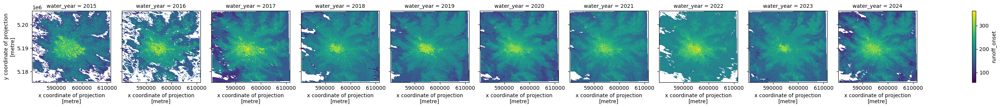

In [6]:
rainier_ds['runoff_onset'].plot.imshow(col='water_year')

In [7]:
runoff_onset_da = rainier_ds['runoff_onset'].sel(water_year=slice(2015,2024))
runoff_onset_da

<xarray.DataArray 'runoff_onset' (water_year: 10, y: 477, x: 488)> Size: 9MB
array([[[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
...
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]],

       [[nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        ...,
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan],
        [nan, nan, nan, ..., nan, nan, nan]]],
      shape=(10, 477, 488), dtype=float32)
Coordinates:
  * x            (x) float64 4kB 5.804e+05 5.805e+05 ... 6.114e+05 6.114e+05
  * y            (y) float64 4kB 5.206e+06 5.206e+06 ... 5.176e+06 5.176e+06
  * water_year   (water_year) int64 80B 2015 2016 2017 2018 ... 2022 2023 2024
    spatial_ref  int64 8B 0
Attributes:
    description:  Estimated day of water year of snowmelt runoff onset for a ...

In [8]:
# only take the median when at least 3 observations
runoff_onset_median_da = runoff_onset_da.median(dim='water_year').where(runoff_onset_da.notnull().sum(dim='water_year')>=3)
runoff_onset_anomaly_da = runoff_onset_da - runoff_onset_median_da
runoff_onset_mad_da = np.abs(runoff_onset_anomaly_da).median(dim='water_year')

Text(0.5, 1.0, 'Runoff Onset Median Absolute Deviation (2015-2022)')

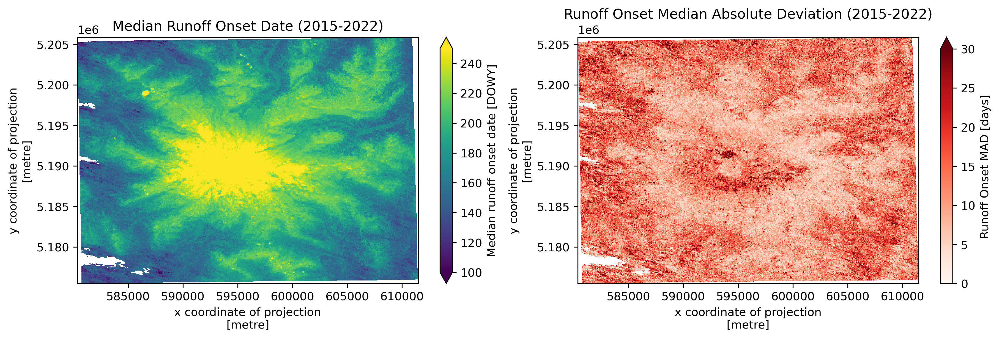

In [9]:
f,axs = plt.subplots(1,2,figsize=(12,4), dpi=300, layout='constrained')
runoff_onset_median_da.plot.imshow(ax=axs[0], cmap='viridis', vmin=100, vmax=250, cbar_kwargs={'label':'Median runoff onset date [DOWY]'})
axs[0].set_title('Median Runoff Onset Date (2015-2022)')
runoff_onset_mad_da.plot.imshow(ax=axs[1], cmap='Reds', vmin=0, vmax=30, cbar_kwargs={'label':'Runoff Onset MAD [days]'})
axs[1].set_title('Runoff Onset Median Absolute Deviation (2015-2022)')


In [10]:
cop30dem_da = easysnowdata.topography.get_copernicus_dem(bbox_input=rainier_bbox_gdf, resolution=30).rio.reproject("EPSG:32610",resolution=30).compute()
cop30dem_da

<xarray.DataArray 'data' (y: 1014, x: 1035)> Size: 4MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]],
      shape=(1014, 1035), dtype=float32)
Coordinates:
  * x            (x) float64 8kB 5.804e+05 5.805e+05 ... 6.114e+05 6.114e+05
  * y            (y) float64 8kB 5.206e+06 5.206e+06 ... 5.176e+06 5.175e+06
    time         datetime64[ns] 8B 2021-04-22
    spatial_ref  int64 8B 0

In [11]:
import xdem

In [12]:
rainier_hillshade_numpy = xdem.terrain.hillshade(cop30dem_da, azimuth=315, altitude=45, resolution=cop30dem_da.rio.resolution()[0])
rainier_hillshade_numpy

array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]],
      shape=(1014, 1035), dtype=float32)

In [13]:
# take numpy array and turn back into xarray with the same coords and dims as cop30dem_da
rainier_hillshade_da = cop30dem_da.copy(data=rainier_hillshade_numpy)
rainier_hillshade_da

<xarray.DataArray 'data' (y: 1014, x: 1035)> Size: 4MB
array([[nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       ...,
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan],
       [nan, nan, nan, ..., nan, nan, nan]],
      shape=(1014, 1035), dtype=float32)
Coordinates:
  * x            (x) float64 8kB 5.804e+05 5.805e+05 ... 6.114e+05 6.114e+05
  * y            (y) float64 8kB 5.206e+06 5.206e+06 ... 5.176e+06 5.175e+06
    time         datetime64[ns] 8B 2021-04-22
    spatial_ref  int64 8B 0

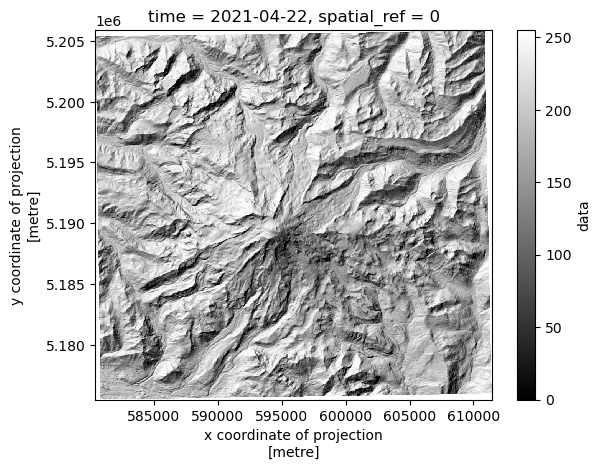

In [14]:
rainier_hillshade_da.plot.imshow(cmap='gray',vmin=0,vmax=255)

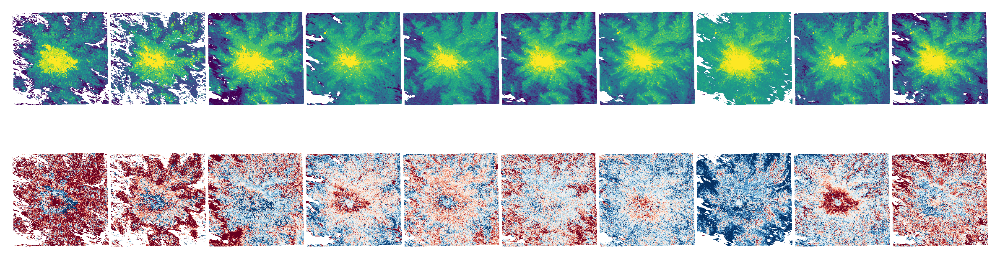

In [15]:
# top row plot annual runoff onset with hillshade background, bottom row anomaly plots with hillshade background
f,ax=plt.subplots(2,len(runoff_onset_da.water_year),figsize=(10,3), dpi=300)
for i, year in enumerate(runoff_onset_da.water_year.values):
    #rainier_hillshade_da.plot.imshow(ax=ax[0,i], cmap='gray', vmin=0, vmax=255, alpha=0.5, zorder=1, add_colorbar=False)

    runoff_onset_da.sel(water_year=year).plot.imshow(ax=ax[0,i], cmap='viridis', vmin=110, vmax=270,zorder=2,alpha=1, add_colorbar=False)
    ax[0,i].set_title('')
    ax[0,i].set_aspect('equal')
    ax[0,i].axis('off')
    
    #rainier_hillshade_da.plot.imshow(ax=ax[1,i], cmap='gray', vmin=0, vmax=255, alpha=0.5, zorder=1, add_colorbar=False)
    runoff_onset_anomaly_da.sel(water_year=year).plot.imshow(ax=ax[1,i], cmap='RdBu', vmin=-30, vmax=30, zorder=2, alpha=1,add_colorbar=False)
    ax[1,i].set_title('')
    ax[1,i].set_aspect('equal')
    ax[1,i].axis('off')
    
f.subplots_adjust(wspace=0.02, hspace=-0.05)

Text(0.5, 1.0, '')

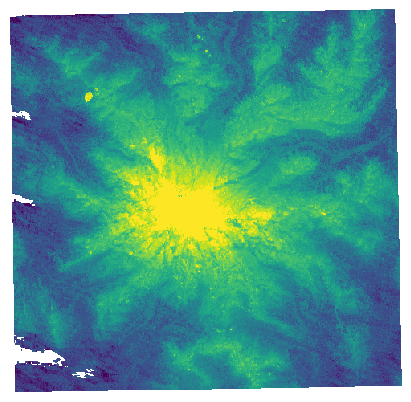

In [16]:
# now create a plot of the median
f,ax=plt.subplots(figsize=(4,5),layout='constrained')
runoff_onset_median_da.plot.imshow(ax=ax, cmap='viridis', vmin=110, vmax=270, add_colorbar=False)
ax.axis('off')
ax.set_aspect('equal')
ax.set_title('')

Text(0.5, 1.0, '')

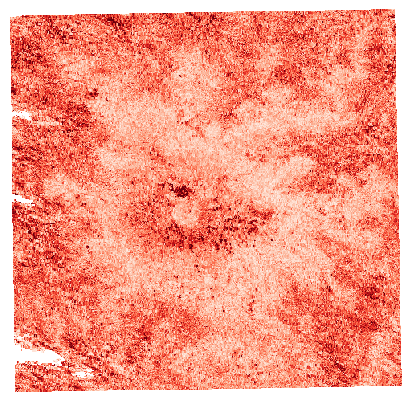

In [17]:
# now create a plot of the median
f,ax=plt.subplots(figsize=(4,5),layout='constrained')
runoff_onset_mad_da.plot.imshow(ax=ax, cmap='Reds', vmin=0, vmax=30, add_colorbar=False)
ax.axis('off')
ax.set_aspect('equal')
ax.set_title('')

In [90]:
baker_gdf = gpd.read_file("geometries/mt_baker.geojson")
glacier_peak_gdf = gpd.read_file("geometries/glacier_peak.geojson")
adams_gdf = gpd.read_file("geometries/mt_adams.geojson")
mt_st_helens_gdf = gpd.read_file("geometries/mt_st_helens.geojson")

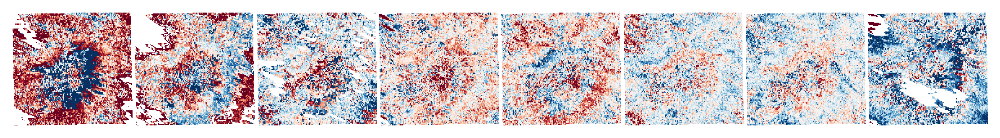

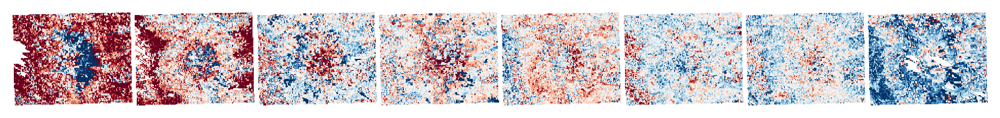

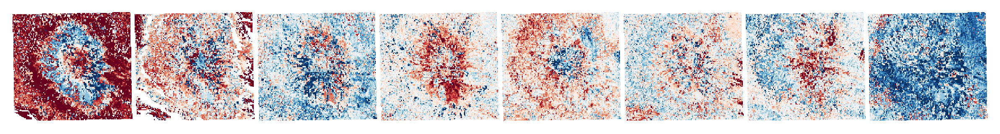

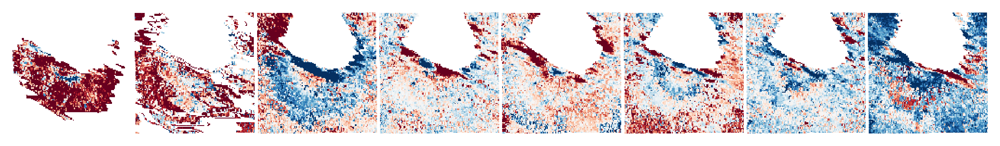

In [92]:
gdfs = [baker_gdf, glacier_peak_gdf, adams_gdf, mt_st_helens_gdf]
for gdf in gdfs:
    mountain_ds = global_ds.rio.clip_box(*gdf.total_bounds).compute().rio.reproject("EPSG:32610")
    runoff_onset_da = mountain_ds['runoff_onset'].sel(water_year=slice(2015,2022))
    runoff_onset_median_da = runoff_onset_da.median(dim='water_year').where(runoff_onset_da.notnull().sum(dim='water_year')>=3)
    runoff_onset_anomaly_da = runoff_onset_da - runoff_onset_median_da
    
    f,ax=plt.subplots(1,len(runoff_onset_da.water_year),figsize=(10,3), dpi=300)
    for i, year in enumerate(runoff_onset_da.water_year.values):
        #rainier_hillshade_da.plot.imshow(ax=ax[0,i], cmap='gray', vmin=0, vmax=255, alpha=0.5, zorder=1, add_colorbar=False)


        #rainier_hillshade_da.plot.imshow(ax=ax[1,i], cmap='gray', vmin=0, vmax=255, alpha=0.5, zorder=1, add_colorbar=False)
        runoff_onset_anomaly_da.sel(water_year=year).plot.imshow(ax=ax[i], cmap='RdBu', vmin=-30, vmax=30, zorder=2, alpha=1,add_colorbar=False)
        ax[i].set_title('')
        ax[i].set_aspect('equal')
        ax[i].axis('off')
        
    f.subplots_adjust(wspace=0.02, hspace=-0.05)
    

# for each gdf